In [ ]:
!apt-get install -y unrar
!pip install rarfile


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1).
0 upgraded, 0 newly installed, 0 to remove and 45 not upgraded.


In [ ]:
import rarfile
import os

# Define the path to the uploaded rar file and the extraction path
rar_path = '/content/dataset.rar'
extract_path = '/content'

# Create the extraction directory if it does not exist
if not os.path.exists(extract_path):
    os.makedirs(extract_path)

# Extract the contents of the rar file
with rarfile.RarFile(rar_path) as rf:
    rf.extractall(path=extract_path)

print(f"Extracted to: {extract_path}")


Extracted to: /content


In [ ]:
import cv2
import numpy as np
import os

# Paths
trainA_path = '/content/dataset/trainA'
output_path = '/content/output'  # Define where you want to save the paired images

# Ensure output directory exists
if not os.path.exists(output_path):
    os.makedirs(output_path)

for filename in os.listdir(trainA_path):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
        # Load the image
        image_path = os.path.join(trainA_path, filename)
        image = cv2.imread(image_path)

        # Convert to grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Apply Gaussian blur
        blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

        # Detect edges
        edges = cv2.Canny(blurred_image, 50, 150)

        # Invert edges to create outline
        outline = cv2.bitwise_not(edges)

        # Convert outline to a 3-channel image for pairing
        outline_colored = cv2.cvtColor(outline, cv2.COLOR_GRAY2BGR)

        # Resize outline to match the original image size if needed
        outline_colored = cv2.resize(outline_colored, (image.shape[1], image.shape[0]))

        # Concatenate images (outline on the left, original on the right)
        paired_image = np.hstack((outline_colored, image))

        # Save the paired image
        output_filename = os.path.join(output_path, filename)
        cv2.imwrite(output_filename, paired_image)

        print(f'Saved paired image: {output_filename}')


Streaming output truncated to the last 5000 lines.
Saved paired image: /content/output/7916_A.jpg
Saved paired image: /content/output/9456_A.jpg
Saved paired image: /content/output/8287_A.jpg
Saved paired image: /content/output/1957_A.jpg
Saved paired image: /content/output/160_A.jpg
Saved paired image: /content/output/2344_A.jpg
Saved paired image: /content/output/6240_A.jpg
Saved paired image: /content/output/5102_A.jpg
Saved paired image: /content/output/1143_A.jpg
Saved paired image: /content/output/6498_A.jpg
Saved paired image: /content/output/4117_A.jpg
Saved paired image: /content/output/6019_A.jpg
Saved paired image: /content/output/1914_A.jpg
Saved paired image: /content/output/7177_A.jpg
Saved paired image: /content/output/6646_A.jpg
Saved paired image: /content/output/8266_A.jpg
Saved paired image: /content/output/6503_A.jpg
Saved paired image: /content/output/3629_A.jpg
Saved paired image: /content/output/8188_A.jpg
Saved paired image: /content/output/2781_A.jpg
Saved pair

In [ ]:
import tensorflow as tf

import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

In [ ]:
import tensorflow as tf
import os

PATH = '/content/output'
image_path = os.path.join(PATH, '1001_A.jpg')

# Read and decode the image
sample_image = tf.io.read_file(image_path)
sample_image = tf.io.decode_jpeg(sample_image)

print(sample_image.shape)


(96, 256, 3)


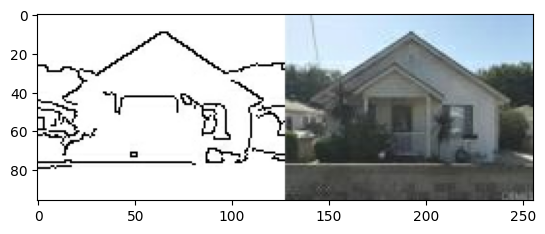

In [ ]:
plt.figure()
plt.imshow(sample_image)

In [ ]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors:
  # - one with a real building facade image
  # - one with an architecture label image
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, :w, :]
  real_image = image[:, w:, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

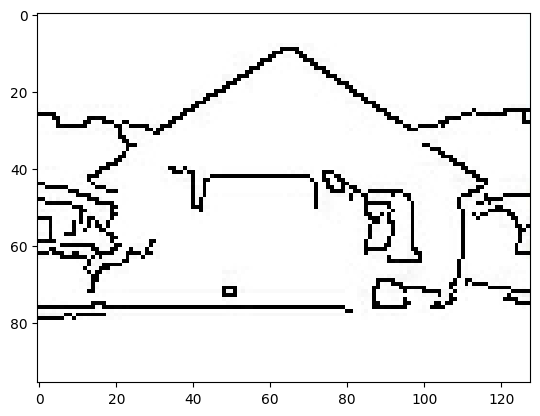

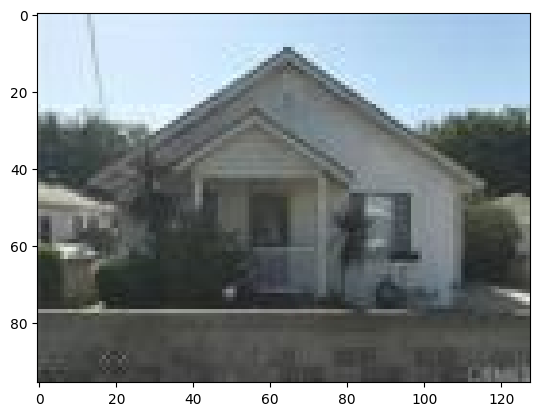

In [ ]:
inp, re = load(image_path)

# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(inp / 255.0)
plt.figure()
plt.imshow(re / 255.0)
plt.show()

In [ ]:
# The facade training set consist of 400 images
BUFFER_SIZE = 400
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 3])

  return cropped_image[0], cropped_image[1]

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

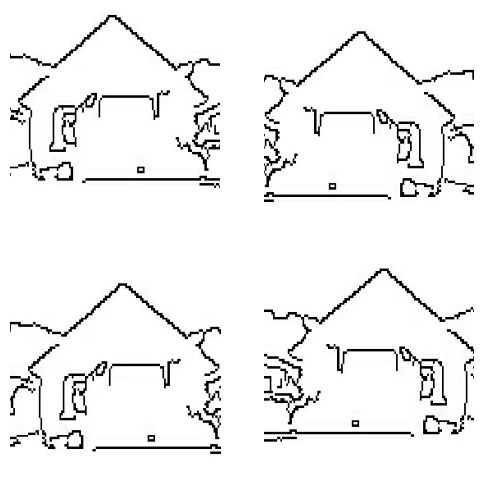

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0)
  plt.axis('off')
plt.show()

In [ ]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize(input_image, real_image,
                                   IMG_HEIGHT, IMG_WIDTH)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
from pathlib import Path
PATH = Path('/content/output')

# Construct the file path pattern using Path object
file_pattern = PATH / '*.jpg'

# Convert Path object to string for TensorFlow functions
file_pattern_str = str(file_pattern)

# Create the dataset
train_dataset = tf.data.Dataset.list_files(file_pattern_str)
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [ ]:
OUTPUT_CHANNELS = 3

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
def Generator():
    inputs = tf.keras.layers.Input(shape=[256, 256, 3])

    # Increase the number of filters in each layer
    down_stack = [
        downsample(128, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 128)
        downsample(256, 4),  # (batch_size, 64, 64, 256)
        downsample(512, 4),  # (batch_size, 32, 32, 512)
        downsample(1024, 4),  # (batch_size, 16, 16, 1024)
        downsample(1024, 4),  # (batch_size, 8, 8, 1024)
        downsample(1024, 4),  # (batch_size, 4, 4, 1024)
        downsample(1024, 4),  # (batch_size, 2, 2, 1024)
        downsample(1024, 4),  # (batch_size, 1, 1, 1024)
    ]

    up_stack = [
        upsample(1024, 4, apply_dropout=True),  # (batch_size, 2, 2, 2048)
        upsample(1024, 4, apply_dropout=True),  # (batch_size, 4, 4, 2048)
        upsample(1024, 4, apply_dropout=True),  # (batch_size, 8, 8, 2048)
        upsample(1024, 4),  # (batch_size, 16, 16, 2048)
        upsample(512, 4),  # (batch_size, 32, 32, 1024)
        upsample(256, 4),  # (batch_size, 64, 64, 512)
        upsample(128, 4),  # (batch_size, 128, 128, 256)
    ]

    initializer = tf.random_normal_initializer(0., 0.02)
    last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                           strides=2,
                                           padding='same',
                                           kernel_initializer=initializer,
                                           activation='tanh')  # (batch_size, 256, 256, 3)

    x = inputs

    # Downsampling through the model
    skips = []
    for down in down_stack:
        x = down(x)
        skips.append(x)

    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connections
    for up, skip in zip(up_stack, skips):
        x = up(x)
        x = tf.keras.layers.Concatenate()([x, skip])

    x = last(x)

    return tf.keras.Model(inputs=inputs, outputs=x)


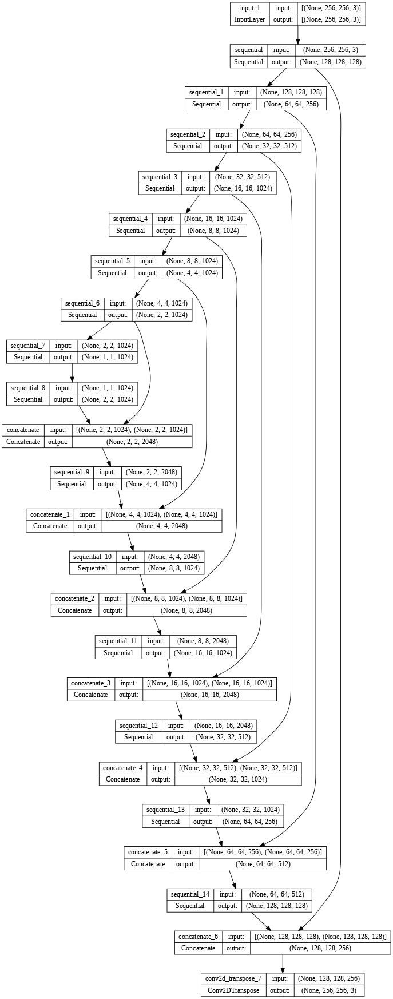

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 3], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 3], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

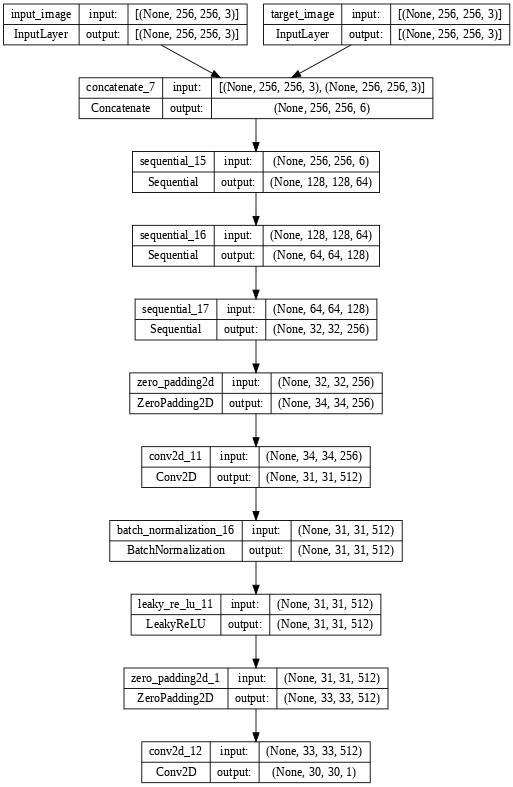

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [ ]:
import cv2
import numpy as np
import os

# Paths
trainA_path = '/content/dataset/testA'
output_path = '/content/outputtest'  # Define where you want to save the paired images

# Ensure output directory exists
if not os.path.exists(output_path):
    os.makedirs(output_path)

for filename in os.listdir(trainA_path):
    if filename.endswith(('.jpg', '.jpeg', '.png')):
        # Load the image
        image_path = os.path.join(trainA_path, filename)
        image = cv2.imread(image_path)

        # Convert to grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Apply Gaussian blur
        blurred_image = cv2.GaussianBlur(gray_image, (5, 5), 0)

        # Detect edges
        edges = cv2.Canny(blurred_image, 50, 150)

        # Invert edges to create outline
        outline = cv2.bitwise_not(edges)

        # Convert outline to a 3-channel image for pairing
        outline_colored = cv2.cvtColor(outline, cv2.COLOR_GRAY2BGR)

        # Resize outline to match the original image size if needed
        outline_colored = cv2.resize(outline_colored, (image.shape[1], image.shape[0]))

        # Concatenate images (outline on the left, original on the right)
        paired_image = np.hstack((outline_colored, image))

        # Save the paired image
        output_filename = os.path.join(output_path, filename)
        cv2.imwrite(output_filename, paired_image)

        print(f'Saved paired image: {output_filename}')


Saved paired image: /content/outputtest/8051_A.jpg
Saved paired image: /content/outputtest/7064_A.jpg
Saved paired image: /content/outputtest/7562_A.jpg
Saved paired image: /content/outputtest/8017_A.jpg
Saved paired image: /content/outputtest/9020_A.jpg
Saved paired image: /content/outputtest/9113_A.jpg
Saved paired image: /content/outputtest/7191_A.jpg
Saved paired image: /content/outputtest/9243_A.jpg
Saved paired image: /content/outputtest/9231_A.jpg
Saved paired image: /content/outputtest/7618_A.jpg
Saved paired image: /content/outputtest/7647_A.jpg
Saved paired image: /content/outputtest/8485_A.jpg
Saved paired image: /content/outputtest/8618_A.jpg
Saved paired image: /content/outputtest/7836_A.jpg
Saved paired image: /content/outputtest/7785_A.jpg
Saved paired image: /content/outputtest/7622_A.jpg
Saved paired image: /content/outputtest/7508_A.jpg
Saved paired image: /content/outputtest/8976_A.jpg
Saved paired image: /content/outputtest/8281_A.jpg
Saved paired image: /content/ou

In [ ]:
from pathlib import Path
PATH = Path('/content/outputtest')

# Construct the file path pattern using Path object
file_pattern = PATH / '*.jpg'

# Convert Path object to string for TensorFlow functions
file_pattern_str = str(file_pattern)

# Create the data
try:
  test_dataset = tf.data.Dataset.list_files(str(PATH / '*.jpg'))
except tf.errors.InvalidArgumentError:
  test_dataset = tf.data.Dataset.list_files(str(PATH / 'val/*.jpg'))
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

In [ ]:
log_dir="logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

save_dir = "/content/saved_models"

import datetime

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)
      timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
      generator.save(f'{save_dir}/generator_epoch_{step + 1}_{timestamp}.keras')
      discriminator.save(f'{save_dir}/discriminator_epoch_{step + 1}_{timestamp}.keras')
      print(f"Models saved for epoch {step + 1}")
      !cp -r /content/saved_models /content/drive/MyDrive/saved_models_pix2pix/
      print("Models copied to Google Drive")

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

Time taken for 1000 steps: 319.88 sec



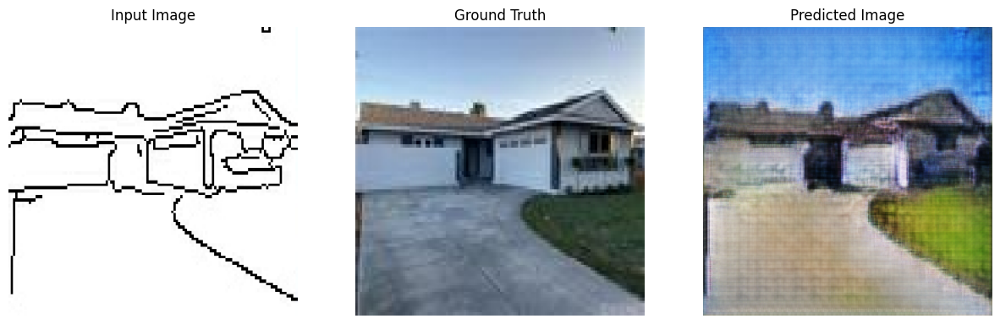

Step: 26k
........................

KeyboardInterrupt: 

In [ ]:
fit(train_dataset, test_dataset, steps=40000)

In [ ]:
ls {checkpoint_dir}

In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

In [ ]:
  !cp -r /content/training_checkpoints /content/drive/MyDrive/saved_models_pix2pix_checpoints/

### ***Load the best checkpoint***

In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore("./training_checkpoints/ckpt-5")

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(generator, inp, tar)

In [ ]:
# prompt: load yhe generator /content/saved_models/generator_epoch_25000_20240827-085606.keras

loaded_generator = tf.keras.models.load_model('/content/saved_models/generator_epoch_25000_20240827-131858.keras')


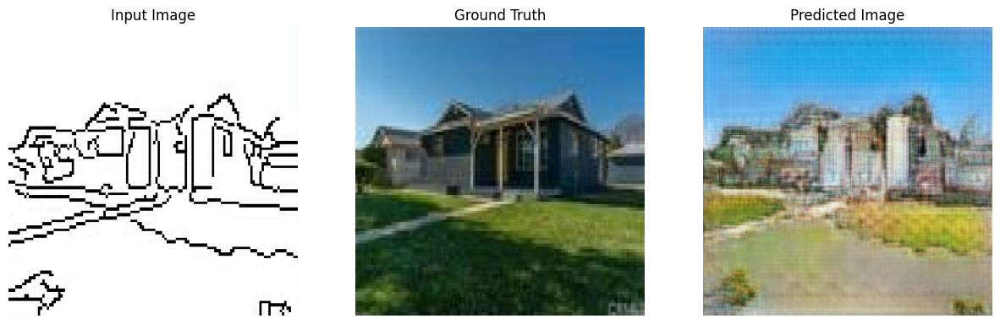

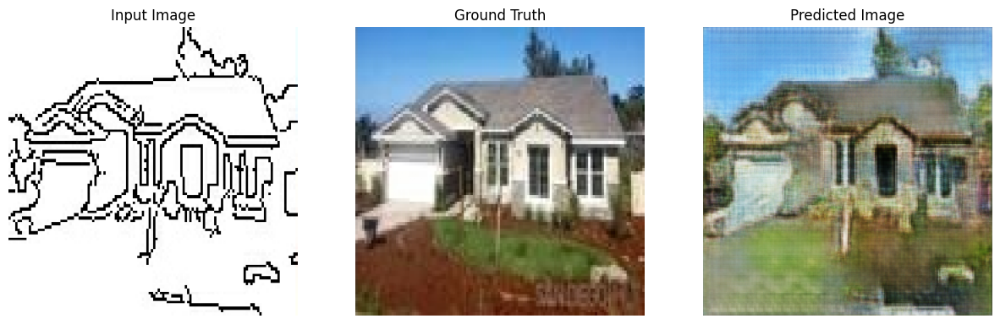

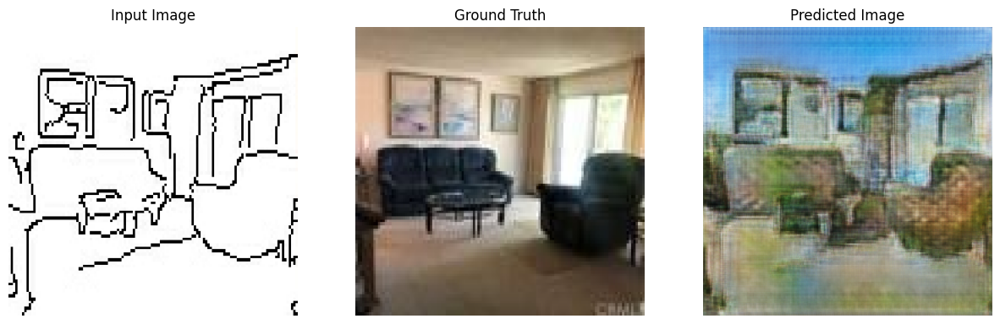

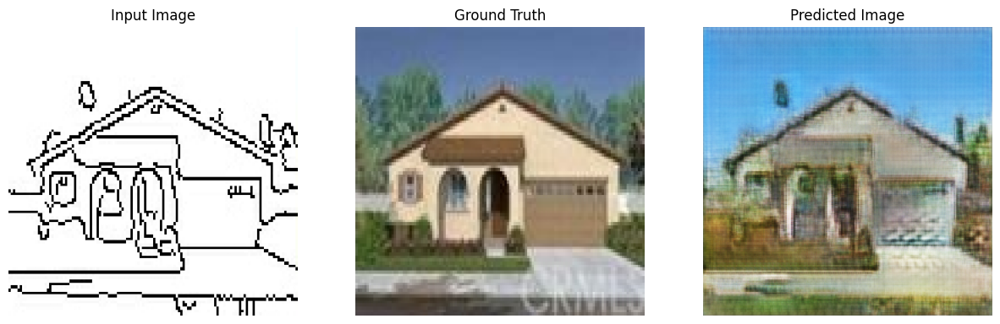

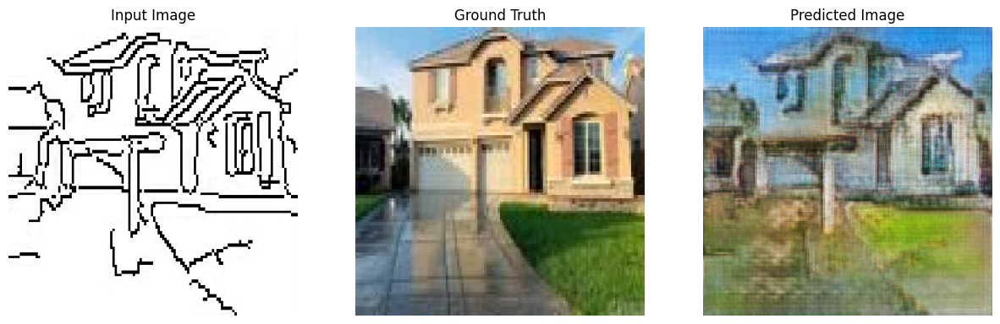

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  generate_images(loaded_generator, inp, tar)

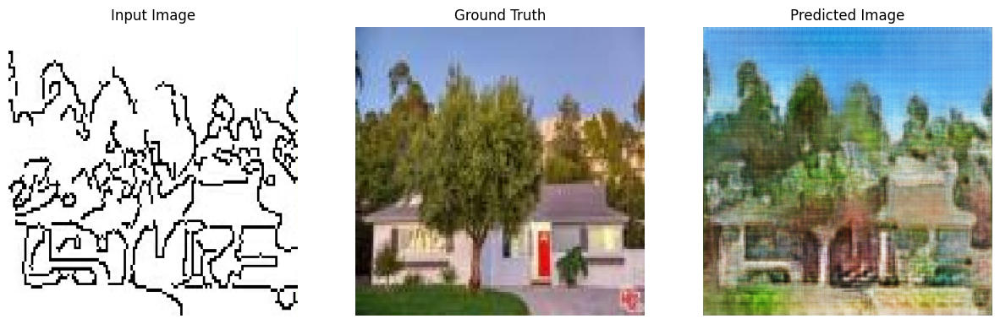

NotFoundError: Error when restoring from checkpoint or SavedModel at ./training_checkpoints/ckpt-8: Unsuccessful TensorSliceReader constructor: Failed to find any matching files for ./training_checkpoints/ckpt-8
Please double-check that the path is correct. You may be missing the checkpoint suffix (e.g. the '-1' in 'path/to/ckpt-1').

In [ ]:
# prompt: GENERATE the image on checkpoint 5 and checkpoint 8 display the same input image on both

# Restoring the checkpoint 5
checkpoint.restore("./training_checkpoints/ckpt-5")
# Taking an example image from the test dataset
example_input, example_target = next(iter(test_dataset.take(1)))
# Generating and displaying the image for checkpoint 5
generate_images(generator, example_input, example_target)

# Restoring the checkpoint 8
checkpoint.restore("./training_checkpoints/ckpt-8")
# Generating and displaying the image for checkpoint 8 (using the same example_input)
generate_images(generator, example_input, example_target)
